# SKW Binary Segmentation Training (v2)

U-Net segmentation on the SKW drone dataset using fastai DataBlock.

- 434 images (792x792) — YOLO bbox labels rasterized into binary masks
- Pretrained ImageNet encoder via segmentation-models-pytorch
- Dice + center-weighted CE loss (weighting computed in loss function)
- fastai batch transforms for augmentations (no callbacks)

In [1]:
import sys

import torch
import numpy as np
import matplotlib.pyplot as plt
from pathlib import Path
from fastai.vision.all import *
import segmentation_models_pytorch as smp

sys.path.insert(0, str(Path.cwd().parent))
sys.path.insert(0, str(Path.cwd()))

In [2]:
from data import build_dataloaders
from loss import DiceCELoss
from metrics import ForegroundIoU, SegDiceMulti
from augs import BatchFlip, BatchRot90

from shared.helpers import print_system_info
from shared.augs import (
    RandomRectangle,
    RandomSharpenBlur,
    DynamicZScoreNormalize,
)
from detection.helpers import plot_channel_histograms

In [3]:
print_system_info()

System Information
-----------------------------------
PyTorch Version : 2.10.0+cu128
CUDA Available  : Yes
CUDA Version    : 12.8
Python Version  : 3.13.7
Fastai Version  : 2.8.7
Default Device  : cuda:0
Device Name     : NVIDIA GeForce RTX 4090
-----------------------------------


In [4]:
# Configuration
model_type = "convnextv2_nano.fcmae_ft_in1k"
model_version = "SKW_SEG_v2"
#########################
use_bf16 = True
#########################
img_size = 800  # must be divisible by 32
#########################
batch_size = 6
gradient_accumulation_batch_size = 16
learning_rate = 0.00008
epoch_count = 10
#########################
# Center-distance loss weighting
clip_distance = 3  # erosion depth for center weighting
max_weight = 5.0  # weight at deepest interior pixels
dice_weight = 10.0
ce_weight = 1.0
#########################
data_dir = Path("/media/nick/4TB Working 7/Datasets/SKW")
#########################
assert data_dir.exists(), f"Dataset not found: {data_dir}"

In [5]:
from collections import Counter
from shared.data import parse_splits

split_map = parse_splits(data_dir)
counts = Counter(split_map.values())
print(
    f"Train: {counts.get('train', 0)}, Val: {counts.get('val', 0)}, Test: {counts.get('test', 0)}"
)
print(f"Total: {sum(counts.values())}")

Train: 387, Val: 45, Test: 2
Total: 434


In [6]:
batch_tfms = [
    BatchFlip(),
    BatchRot90(),
    DynamicZScoreNormalize(target_mean=0.0, target_std=1.0),
    # RandomRectangle(p=0.3, sl=0.05, sh=0.4),
    RandomSharpenBlur(min_factor=0.5, max_factor=1.5),
]

In [ ]:
dls = build_dataloaders(
    data_dir=data_dir,
    img_size=img_size,
    bs=batch_size,
    batch_tfms=batch_tfms,
)

In [ ]:
# Inspect a training batch
batch = next(iter(dls.train))
images, masks = batch[0], batch[1]
print(f"Image shape: {images.shape}")
print(f"Mask shape:  {masks.shape}")
print(f"Mask unique values: {masks.unique().tolist()}")
print(f"Foreground pixel ratio: {masks.float().mean().item():.4f}")
print(f"Image dtype: {images.dtype}")
print(f"Image range: [{images.min().item():.3f}, {images.max().item():.3f}]")

In [9]:
# # Visualize batch: RGB + per-channel + mask + overlay (OWM-style)
# n_show = min(4, images.shape[0])
# num_cols = 6  # RGB | R | G | B | Mask | Overlay
# fig, axs = plt.subplots(n_show, num_cols, figsize=(5 * num_cols, 4.5 * n_show))
# if n_show == 1:
#     axs = np.expand_dims(axs, axis=0)

# # Downsample for display speed (800x800 → 200x200)
# s = 4
# channel_names = ["Red", "Green", "Blue"]
# for row in range(n_show):
#     img_float = images[row, :, ::s, ::s].cpu().float()
#     rgb = img_float[:3].numpy().transpose(1, 2, 0)
#     rgb = (rgb - rgb.min()) / (rgb.max() - rgb.min() + 1e-8)
#     mask = masks[row, ::s, ::s].cpu().numpy()

#     # RGB
#     axs[row, 0].imshow(rgb)
#     if row == 0:
#         axs[row, 0].set_title("RGB")
#     axs[row, 0].axis("off")

#     # Per-channel
#     for ch in range(3):
#         axs[row, ch + 1].imshow(img_float[ch].numpy(), cmap="gray")
#         if row == 0:
#             axs[row, ch + 1].set_title(channel_names[ch])
#         axs[row, ch + 1].axis("off")

#     # Mask
#     axs[row, 4].imshow(mask, cmap="gray", interpolation="nearest", vmin=0, vmax=1)
#     if row == 0:
#         axs[row, 4].set_title("Mask")
#     axs[row, 4].axis("off")

#     # Overlay
#     axs[row, 5].imshow(rgb)
#     axs[row, 5].imshow(
#         mask, alpha=0.4, cmap="Reds", interpolation="nearest", vmin=0, vmax=1
#     )
#     if row == 0:
#         axs[row, 5].set_title("Overlay")
#     axs[row, 5].axis("off")

# plt.tight_layout()
# plt.show()

Image stats (800x800)
Channel          Mean        Std        Min        Max
----------------------------------------------------
Red           -0.0000     1.0000    -3.4876     2.2108
Green         -0.0000     1.0000    -3.3127     2.5825
Blue          -0.0000     0.9999    -3.1498     3.1548
----------------------------------------------------
All.......    -0.0000     1.0000    -3.4876     3.1548


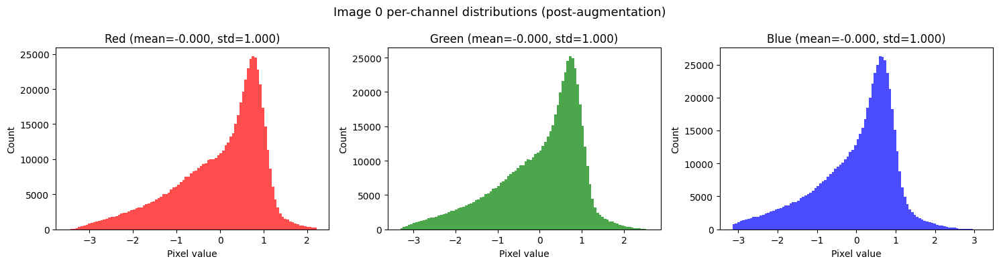

In [10]:
# Per-channel histogram for first image in batch
plot_channel_histograms(
    images[0], title="Image 0 per-channel distributions (post-augmentation)"
)

In [12]:
# # Visualize center-distance weights (computed by loss function)
# from loss import center_distance_weights

# with torch.no_grad():
#     weights = center_distance_weights(
#         masks, clip_distance=clip_distance, max_weight=max_weight
#     )

# fig, axes = plt.subplots(1, n_show, figsize=(5 * n_show, 5))
# for i in range(n_show):
#     img = images[i].cpu().numpy().transpose(1, 2, 0)
#     img = (img - img.min()) / (img.max() - img.min() + 1e-8)
#     wmap = weights[i].cpu().numpy()

#     axes[i].imshow(img)
#     axes[i].imshow(wmap, alpha=0.5, cmap="hot", vmin=1.0, vmax=wmap.max())
#     axes[i].set_title(f"Weight map {i} (max={wmap.max():.1f})")
#     axes[i].axis("off")
# fig.suptitle("Center-distance weights (computed in loss function)", fontsize=14)
# plt.tight_layout()
# plt.show()

In [13]:
model = smp.Unet(
    encoder_name=f"tu-{model_type.split('.')[0]}",
    encoder_weights="imagenet",
    in_channels=3,
    classes=2,  # background + foreground
)

In [14]:
# Verify forward pass
dummy = torch.randn(2, 3, img_size, img_size)
out = model(dummy)
print(f"Output shape: {out.shape}")
assert out.shape == (2, 2, img_size, img_size), (
    f"Expected (2, 2, {img_size}, {img_size})"
)

Output shape: torch.Size([2, 2, 800, 800])


In [15]:
callbacks = [
    ShowGraphCallback(),
    GradientAccumulation(gradient_accumulation_batch_size),
    SaveModelCallback(monitor="fg_iou"),
]

learner = Learner(
    dls=dls,
    model=model,
    loss_func=DiceCELoss(
        dice_weight=dice_weight,
        ce_weight=ce_weight,
        clip_distance=clip_distance,
        max_weight=max_weight,
    ),
    metrics=[SegDiceMulti(), ForegroundIoU()],
    cbs=callbacks,
)

In [16]:
if use_bf16:
    learner = learner.to_bf16()

epoch,train_loss,valid_loss,seg_dice_multi,fg_iou,time
0,9.539083,9.575673,0.277735,0.099001,00:22
1,8.876445,8.850204,0.456104,0.151786,00:15
2,7.969816,8.130361,0.582655,0.221054,00:15
3,7.361216,7.099895,0.809698,0.498775,00:15
4,7.045567,7.339134,0.714973,0.352942,00:15
5,6.692713,7.148836,0.752710,0.406004,00:15
6,6.460483,6.572753,0.846814,0.571980,00:15
7,6.205307,6.441104,0.843079,0.564192,00:15
8,6.193090,6.415444,0.857138,0.593541,00:15
9,6.150830,6.512170,0.841961,0.562031,00:16


Better model found at epoch 0 with fg_iou value: 0.09900064194338985.


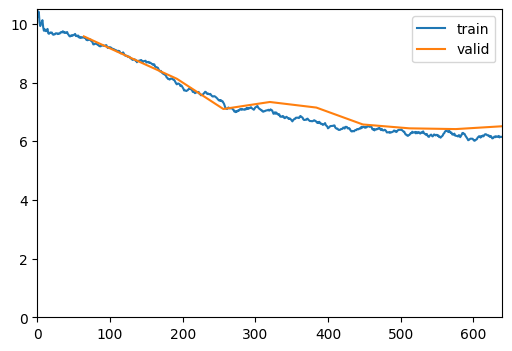

Better model found at epoch 1 with fg_iou value: 0.1517855047941098.
Better model found at epoch 2 with fg_iou value: 0.22105440174892793.
Better model found at epoch 3 with fg_iou value: 0.4987749400229936.
Better model found at epoch 6 with fg_iou value: 0.571979883672591.
Better model found at epoch 8 with fg_iou value: 0.5935407550422483.


In [17]:
learner.fit_one_cycle(
    n_epoch=epoch_count,
    lr_max=learning_rate,
)

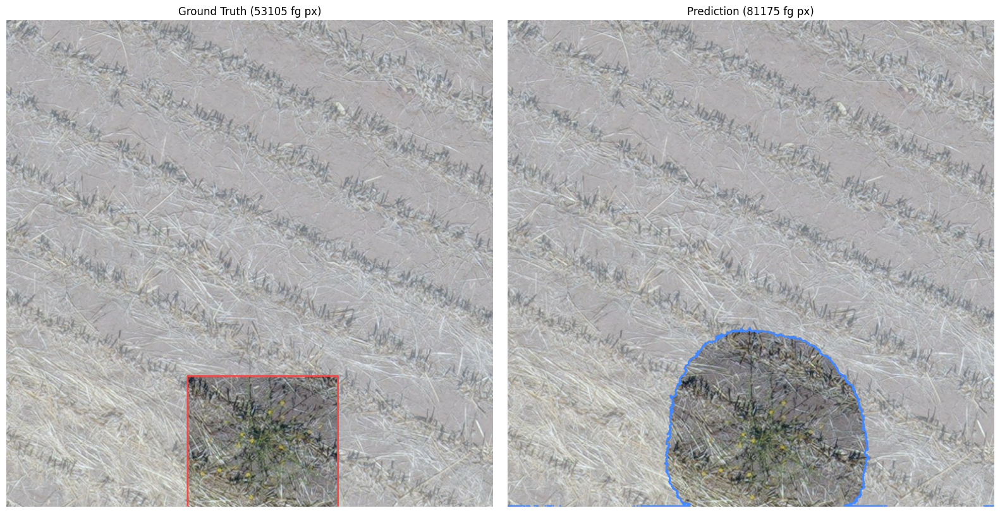

Image 0: GT 53105 fg px, Pred 81175 fg px


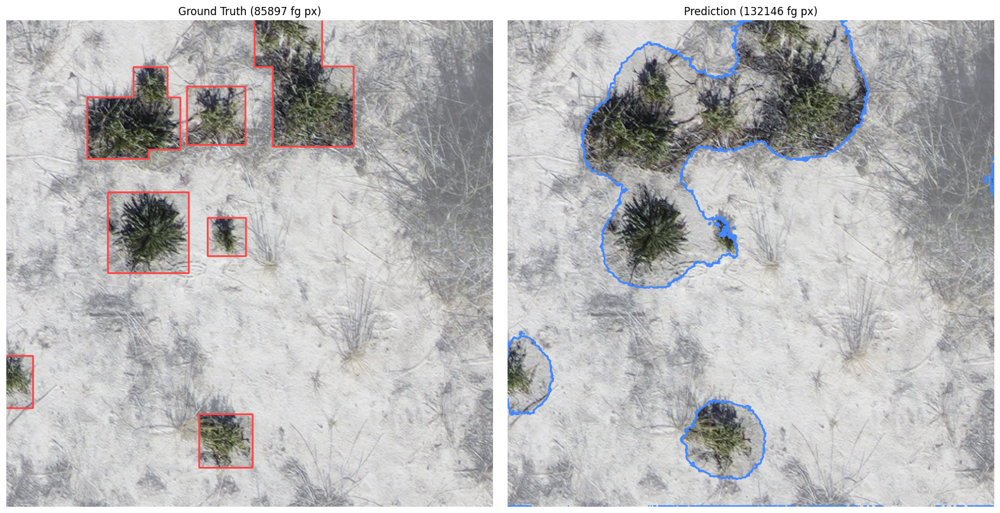

Image 1: GT 85897 fg px, Pred 132146 fg px


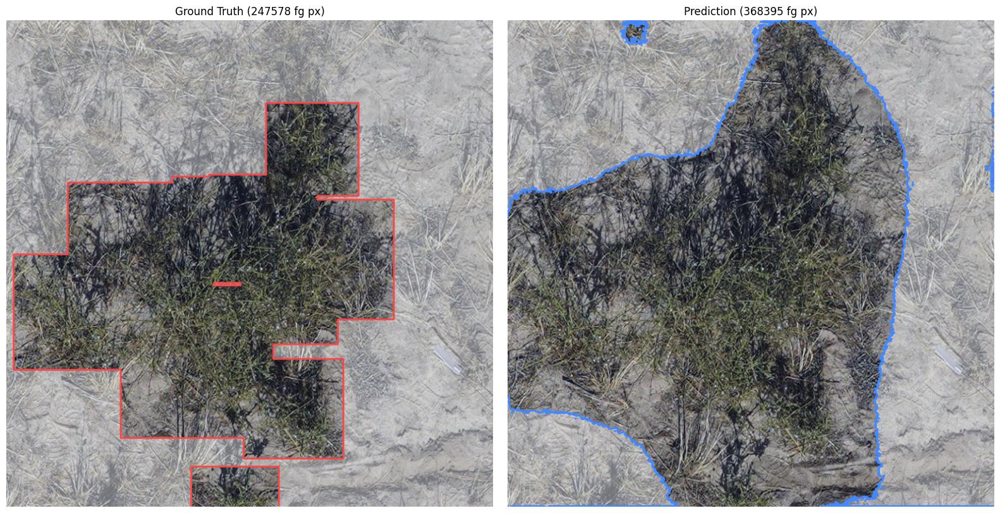

Image 2: GT 247578 fg px, Pred 368395 fg px


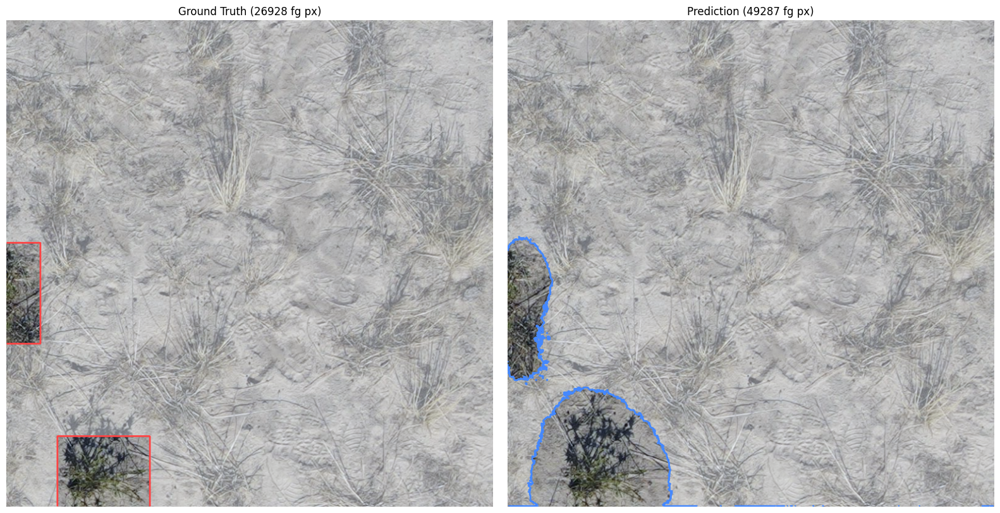

Image 3: GT 26928 fg px, Pred 49287 fg px


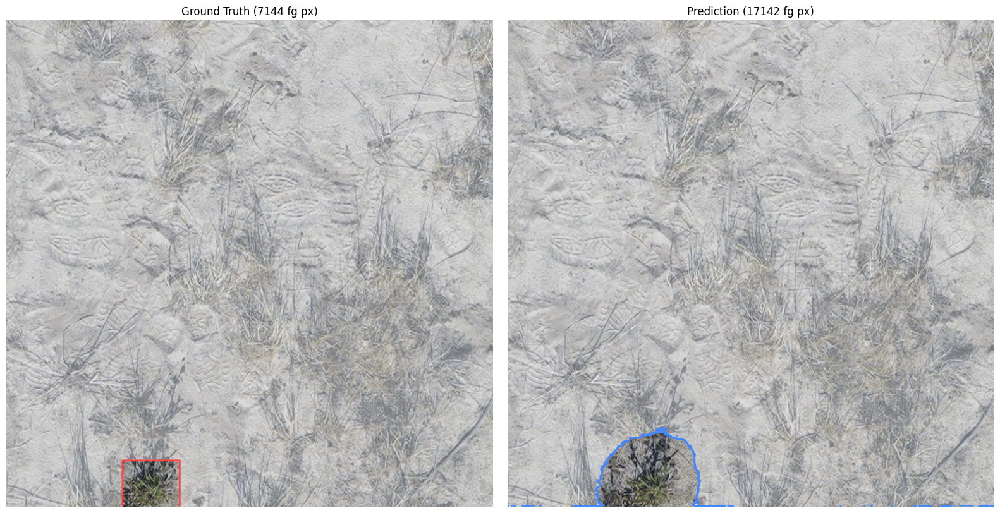

Image 4: GT 7144 fg px, Pred 17142 fg px


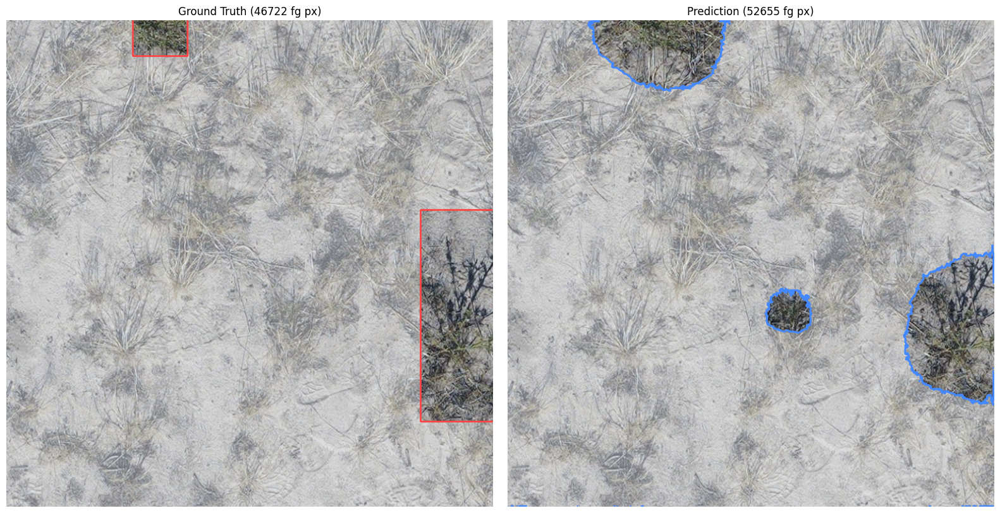

Image 5: GT 46722 fg px, Pred 52655 fg px


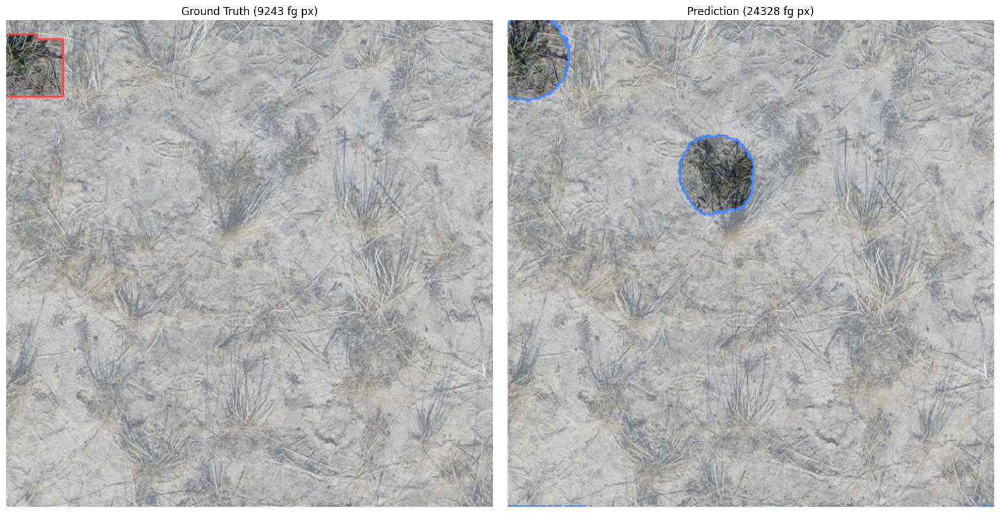

Image 6: GT 9243 fg px, Pred 24328 fg px


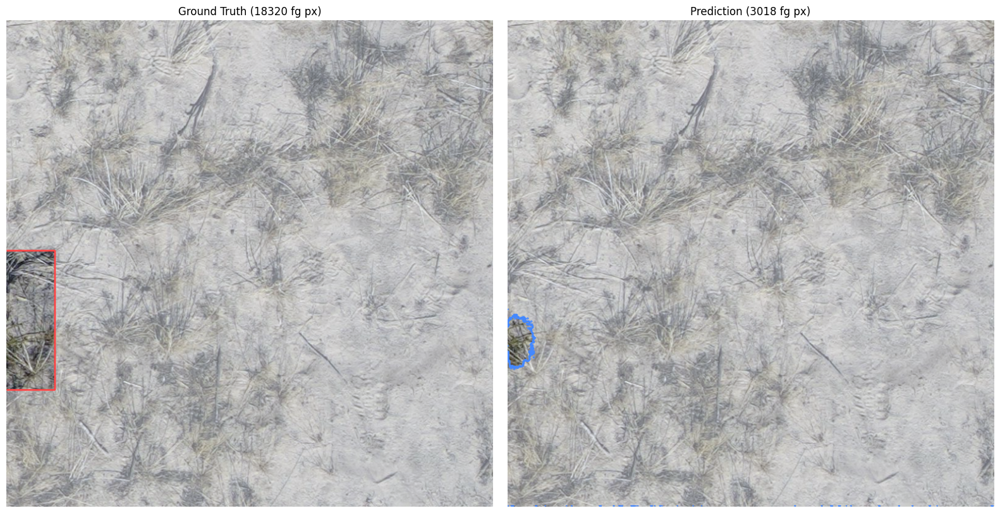

Image 7: GT 18320 fg px, Pred 3018 fg px


In [18]:
# Visualize predictions on validation images
n_images = 8

model = learner.model.cuda().float()
model.eval()

all_images, all_gt, all_pred = [], [], []
val_iter = iter(dls.valid)
while len(all_images) < n_images:
    try:
        val_batch = next(val_iter)
        val_images, val_masks = val_batch[0], val_batch[1]
    except StopIteration:
        break
    with torch.no_grad():
        logits = model(val_images.cuda().float())
        preds = logits.argmax(dim=1).cpu()
    for i in range(val_images.shape[0]):
        if len(all_images) >= n_images:
            break
        all_images.append(val_images[i])
        all_gt.append(val_masks[i])
        all_pred.append(preds[i])

for img_idx in range(len(all_images)):
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(16, 8))

    img = all_images[img_idx].cpu().float().numpy().transpose(1, 2, 0)
    img = (img - img.min()) / (img.max() - img.min() + 1e-8)
    gt = all_gt[img_idx].cpu().numpy()
    pred = all_pred[img_idx].numpy()

    bg_overlay = np.ones_like(img)  # white

    # Ground truth (left)
    ax1.imshow(img)
    ax1.imshow(bg_overlay, alpha=np.where(gt == 0, 0.4, 0.0))
    if gt.max() > 0:
        ax1.contour(gt, levels=[0.5], colors=["#FF4444"], linewidths=2)
    ax1.set_title(f"Ground Truth ({gt.sum()} fg px)")
    ax1.axis("off")

    # Prediction (right)
    ax2.imshow(img)
    ax2.imshow(bg_overlay, alpha=np.where(pred == 0, 0.4, 0.0))
    if pred.max() > 0:
        ax2.contour(pred, levels=[0.5], colors=["#4488FF"], linewidths=2)
    ax2.set_title(f"Prediction ({pred.sum()} fg px)")
    ax2.axis("off")

    plt.tight_layout()
    plt.show()
    print(f"Image {img_idx}: GT {gt.sum()} fg px, Pred {pred.sum()} fg px")